### Checking environment

In [ ]:
!python --version
!conda --version
!which conda
!which python
!which jupyter
!which pip
!conda info --envs
!pip list

### List of dependencies

In [64]:
# dependencies
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt

formats = f'%Y-%m-%d %H-%M-%S'

import os

def list_files_in_folder(folder_path, ascending=True):
    try:
        # Get a list of all files and directories in the given folder
        files = os.listdir(folder_path)

        # Filter out only the files (excluding directories) and create a list
        files_list = [f for f in files if os.path.isfile(os.path.join(folder_path, f))]

        # Sort the list by name in ascending or descending order
        files_list.sort() if ascending else files_list.sort(reverse=True)

        return files_list
    except FileNotFoundError:
        print("Folder not found.")
        return []
    except Exception as e:
        print(f"An error occurred: {e}")
        return []

### Dataframes timestamps of users entered and exited meetings

In [65]:
from datetime import datetime

def convert_date_time(input_string):
    try:
        # Parse the input string using the datetime.strptime() method
        # The format %d/%m/%Y %H:%M:%S represents "day/month/year hour:minute:second"
        input_datetime = datetime.strptime(input_string, "%d/%m/%Y %H:%M:%S")

        # Format the datetime object in the desired output format
        # The format %Y-%m-%d %H-%M-%S represents "year-month-day hour-minute-second"
        output_string = input_datetime.strftime("%Y-%m-%d %H-%M-%S")

        return output_string
    except ValueError:
        print("Invalid date/time format. Please provide the correct format (e.g., 14/06/2023 13:25:18).")
        return None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None

users = pd.read_csv('./csv_newest/bandwidth_timestamps.csv')
bandwidth_timestamps = pd.DataFrame(users)

bandwidth_timestamps['gmeet_webcam_entered'] = bandwidth_timestamps['gmeet_webcam_entered'].apply(convert_date_time)
bandwidth_timestamps['gmeet_webcam_exited'] = bandwidth_timestamps['gmeet_webcam_exited'].apply(convert_date_time)
bandwidth_timestamps['gmeet_screen_entered'] = bandwidth_timestamps['gmeet_screen_entered'].apply(convert_date_time)
bandwidth_timestamps['gmeet_screen_exited'] = bandwidth_timestamps['gmeet_screen_exited'].apply(convert_date_time)
bandwidth_timestamps['zoom_webcam_entered'] = bandwidth_timestamps['zoom_webcam_entered'].apply(convert_date_time)
bandwidth_timestamps['zoom_webcam_exited'] = bandwidth_timestamps['zoom_webcam_exited'].apply(convert_date_time)
bandwidth_timestamps['zoom_screen_entered'] = bandwidth_timestamps['zoom_screen_entered'].apply(convert_date_time)
bandwidth_timestamps['zoom_screen_exited'] = bandwidth_timestamps['zoom_screen_exited'].apply(convert_date_time)
bandwidth_timestamps['siruntu_webcam_entered'] = bandwidth_timestamps['siruntu_webcam_entered'].apply(convert_date_time)
bandwidth_timestamps['siruntu_webcam_exited'] = bandwidth_timestamps['siruntu_webcam_exited'].apply(convert_date_time)
bandwidth_timestamps['siruntu_screen_entered'] = bandwidth_timestamps['siruntu_screen_entered'].apply(convert_date_time)
bandwidth_timestamps['siruntu_screen_exited'] = bandwidth_timestamps['siruntu_screen_exited'].apply(convert_date_time)

# convert to datetime
apps = ['gmeet', 'zoom', 'siruntu']
modes = ['webcam', 'screen']
enterences = ['entered', 'exited']

for app in apps:
    for mode in modes:
        for enterence in enterences:
            bandwidth_timestamps[f'{app}_{mode}_{enterence}'] = pd.to_datetime(bandwidth_timestamps[f'{app}_{mode}_{enterence}'], format=formats)


users = bandwidth_timestamps['name'].unique()
bandwidth_timestamps

,name,type,gmeet_webcam_entered,gmeet_webcam_exited,gmeet_screen_entered,gmeet_screen_exited,zoom_webcam_entered,zoom_webcam_exited,zoom_screen_entered,zoom_screen_exited,siruntu_webcam_entered,siruntu_webcam_exited,siruntu_screen_entered,siruntu_screen_exited
0,presenter,presenter,2023-06-14 13:25:18,2023-06-14 13:50:04,2023-06-14 13:55:04,2023-06-14 14:20:01,2023-06-14 14:30:02,2023-06-14 14:55:04,2023-06-14 15:00:04,2023-06-14 15:25:00,2023-06-15 14:50:12,2023-06-15 15:11:03,2023-06-15 15:25:15,2023-06-15 15:46:01
1,viewer_1,viewer,2023-06-14 13:26:20,2023-06-14 13:50:01,2023-06-14 13:56:26,2023-06-14 14:20:01,2023-06-14 14:31:21,2023-06-14 14:55:01,2023-06-14 15:02:31,2023-06-14 15:25:01,2023-06-15 14:51:08,2023-06-15 15:11:03,2023-06-15 15:27:03,2023-06-15 15:48:03
2,viewer_2,viewer,2023-06-14 13:27:31,2023-06-14 13:48:01,2023-06-14 13:57:31,2023-06-14 14:20:01,2023-06-14 14:32:16,2023-06-14 14:55:02,2023-06-14 15:02:32,2023-06-14 15:25:02,2023-06-15 14:52:10,2023-06-15 15:11:00,2023-06-15 15:27:20,2023-06-15 15:46:00
3,viewer_3,viewer,2023-06-14 13:28:18,2023-06-14 13:50:03,2023-06-14 13:58:18,2023-06-14 14:20:03,2023-06-14 14:33:18,2023-06-14 14:55:03,2023-06-14 15:03:13,2023-06-14 15:25:03,2023-06-15 14:53:07,2023-06-15 15:11:02,2023-06-15 15:28:27,2023-06-15 15:47:02
4,viewer_4,viewer,2023-06-14 13:29:19,2023-06-14 13:50:04,2023-06-14 13:59:15,2023-06-14 14:20:00,2023-06-14 14:34:30,2023-06-14 14:55:00,2023-06-14 15:04:05,2023-06-14 15:25:00,2023-06-15 14:54:07,2023-06-15 15:11:03,2023-06-15 15:29:08,2023-06-15 15:47:03
5,viewer_5,viewer,2023-06-14 13:30:22,2023-06-14 13:50:02,2023-06-14 14:00:22,2023-06-14 14:20:03,2023-06-14 14:35:13,2023-06-14 14:55:03,2023-06-14 15:05:33,2023-06-14 15:25:03,2023-06-15 14:55:56,2023-06-15 15:11:01,2023-06-15 15:30:11,2023-06-15 15:47:01
6,viewer_6,viewer,2023-06-14 13:31:45,2023-06-14 13:50:02,2023-06-14 14:01:13,2023-06-14 14:20:01,2023-06-14 14:36:17,2023-06-14 14:55:02,2023-06-14 15:06:12,2023-06-14 15:25:02,2023-06-15 14:56:05,2023-06-15 15:12:01,2023-06-15 15:31:09,2023-06-15 15:46:01
7,viewer_7,viewer,2023-06-14 13:32:22,2023-06-14 13:50:02,2023-06-14 14:02:57,2023-06-14 14:20:02,2023-06-14 14:37:17,2023-06-14 14:55:04,2023-06-14 15:07:08,2023-06-14 15:25:03,2023-06-15 14:57:10,2023-06-15 15:11:00,2023-06-15 15:32:10,2023-06-15 15:46:00
8,viewer_8,viewer,2023-06-14 13:33:29,2023-06-14 13:50:04,2023-06-14 14:03:19,2023-06-14 14:20:00,2023-06-14 14:38:20,2023-06-14 14:55:00,2023-06-14 15:08:40,2023-06-14 15:25:00,2023-06-15 14:58:14,2023-06-15 15:11:04,2023-06-15 15:33:10,2023-06-15 15:47:00
9,viewer_9,viewer,2023-06-14 13:34:17,2023-06-14 13:50:02,2023-06-14 14:04:28,2023-06-14 14:20:03,2023-06-14 14:39:28,2023-06-14 14:55:03,2023-06-14 15:09:33,2023-06-14 15:25:03,2023-06-15 14:59:04,2023-06-15 15:11:04,2023-06-15 15:34:14,2023-06-15 15:47:04


### Client resources usage

#### Load files

In [66]:
# # read csv file
# bandwidth_df = pd.DataFrame()
# custom_user_order = []

# list_of_folder = list_files_in_folder('./csv_newest/bandwidth/')

# for i in range(0, len(list_of_folder)):
#     gmeet_range = {
#         'start_webcam': bandwidth_timestamps.loc[i, 'gmeet_webcam_entered'],
#         'end_webcam': bandwidth_timestamps.loc[i, 'gmeet_webcam_exited'],
#         'start_screen': bandwidth_timestamps.loc[i, 'gmeet_screen_entered'],
#         'end_screen': bandwidth_timestamps.loc[i, 'gmeet_screen_exited']
#     }

#     zoom_range = {
#         'start_webcam': bandwidth_timestamps.loc[i, 'zoom_webcam_entered'],
#         'end_webcam': bandwidth_timestamps.loc[i, 'zoom_webcam_exited'],
#         'start_screen': bandwidth_timestamps.loc[i, 'zoom_screen_entered'],
#         'end_screen': bandwidth_timestamps.loc[i, 'zoom_screen_exited']
#     }

#     siruntu_range = {
#         'start_webcam': bandwidth_timestamps.loc[i, 'siruntu_webcam_entered'],
#         'end_webcam': bandwidth_timestamps.loc[i, 'siruntu_webcam_exited'],
#         'start_screen': bandwidth_timestamps.loc[i, 'siruntu_screen_entered'],
#         'end_screen': bandwidth_timestamps.loc[i, 'siruntu_screen_exited']
#     }

#     the_path = f'./csv_newest/bandwidth/{list_of_folder[i]}'
#     df_app = pd.read_csv(the_path)

#     # rename columns with lower case and replace space with underscore
#     df_app.columns = df_app.columns.str.lower().str.replace(' ', '_')

#     # add column to dataframe
#     name = f'viewer_{str(i)}'
#     name = name if i > 0 else 'presenter'
#     df_app['user'] = name
#     custom_user_order.append(name)

#     # filter by column File that non contain NaN
#     df_app = df_app[df_app['file'].notna()]

#     # filter by column Protocol that contain string 'UDP'
#     df_app = df_app[df_app['protocol'].str.contains('UDP')]

#     # filter by column file that contain string 'chrome'
#     df_app = df_app[df_app['file'].str.contains('chrome')]

#     # convert to datetime
#     df_app['time'] = pd.to_datetime(
#         df_app['time'], format=formats)

#     # filter by time range
#     df_gmeet_webcam = df_app[(df_app['time'] >= gmeet_range['start_webcam']) & (df_app['time'] <= gmeet_range['end_webcam'])]
#     df_gmeet_webcam = df_gmeet_webcam.groupby(['time']).sum().reset_index()
#     df_gmeet_webcam['app'] = 'gmeet'
#     df_gmeet_webcam['media'] = 'webcam'
#     df_gmeet_webcam['user'] = name
#     df_gmeet_screen = df_app[(df_app['time'] >= gmeet_range['start_screen']) & (df_app['time'] <= gmeet_range['end_screen'])]
#     df_gmeet_screen = df_gmeet_screen.groupby(['time']).sum().reset_index()
#     df_gmeet_screen['app'] = 'gmeet'
#     df_gmeet_screen['media'] = 'screen'
#     df_gmeet_screen['user'] = name
#     df_zoom_webcam = df_app[(df_app['time'] >= zoom_range['start_webcam']) & (df_app['time'] <= zoom_range['end_webcam'])]
#     df_zoom_webcam = df_zoom_webcam.groupby(['time']).sum().reset_index()
#     df_zoom_webcam['app'] = 'zoom'
#     df_zoom_webcam['media'] = 'webcam'
#     df_zoom_webcam['user'] = name
#     df_zoom_screen = df_app[(df_app['time'] >= zoom_range['start_screen']) & (df_app['time'] <= zoom_range['end_screen'])]
#     df_zoom_screen = df_zoom_screen.groupby(['time']).sum().reset_index()
#     df_zoom_screen['app'] = 'zoom'
#     df_zoom_screen['media'] = 'screen'
#     df_zoom_screen['user'] = name
#     df_siruntu_webcam = df_app[(df_app['time'] >= siruntu_range['start_webcam']) & (df_app['time'] <= siruntu_range['end_webcam'])]
#     df_siruntu_webcam = df_siruntu_webcam.groupby(['time']).sum().reset_index()
#     df_siruntu_webcam['app'] = 'siruntu'
#     df_siruntu_webcam['media'] = 'webcam'
#     df_siruntu_webcam['user'] = name
#     df_siruntu_screen = df_app[(df_app['time'] >= siruntu_range['start_screen']) & (df_app['time'] <= siruntu_range['end_screen'])]
#     df_siruntu_screen = df_siruntu_screen.groupby(['time']).sum().reset_index()
#     df_siruntu_screen['app'] = 'siruntu'
#     df_siruntu_screen['media'] = 'screen'
#     df_siruntu_screen['user'] = name

#     # concatenate dataframe
#     # bandwidth_df = pd.concat([bandwidth_df, df_gmeet_webcam, df_gmeet_screen, df_zoom_webcam, df_zoom_screen, df_siruntu_webcam, df_siruntu_screen])
#     df_gmeet_save = pd.concat([df_gmeet_webcam, df_gmeet_screen]).sort_values(by=['time'])
#     df_zoom_save = pd.concat([df_zoom_webcam, df_zoom_screen]).sort_values(by=['time'])
#     df_siruntu_save = pd.concat([df_siruntu_webcam, df_siruntu_screen]).sort_values(by=['time'])

#     # save to csv
#     df_gmeet_save.to_csv(f'./csv_newest/sorted_bandwidth/{name}_gmeet.csv', index=False)
#     df_zoom_save.to_csv(f'./csv_newest/sorted_bandwidth/{name}_zoom.csv', index=False)
#     df_siruntu_save.to_csv(f'./csv_newest/sorted_bandwidth/{name}_siruntu.csv', index=False)

# bandwidth_df

#### Segmented dataframes

In [67]:
gmeet = pd.DataFrame()
zoom = pd.DataFrame()
siruntu = pd.DataFrame()

apps = ['gmeet', 'zoom', 'siruntu']
users = bandwidth_timestamps['name'].unique()
for app in apps:
    for user in users:
        df = pd.read_csv(f'./csv_newest/sorted_bandwidth/{user}_{app}.csv')
        if app == 'gmeet':
            gmeet = pd.concat([gmeet, df])
        elif app == 'zoom':
            zoom = pd.concat([zoom, df])
        elif app == 'siruntu':
            siruntu = pd.concat([siruntu, df])

gmeet = gmeet.reset_index()
zoom = zoom.reset_index()
siruntu = siruntu.reset_index()

# add column from index
gmeet['index'] = gmeet.index
zoom['index'] = zoom.index
siruntu['index'] = siruntu.index

siruntu.to_csv('./tmp/siruntu.csv', index=False)

#### Throughput (download and upload) in client side

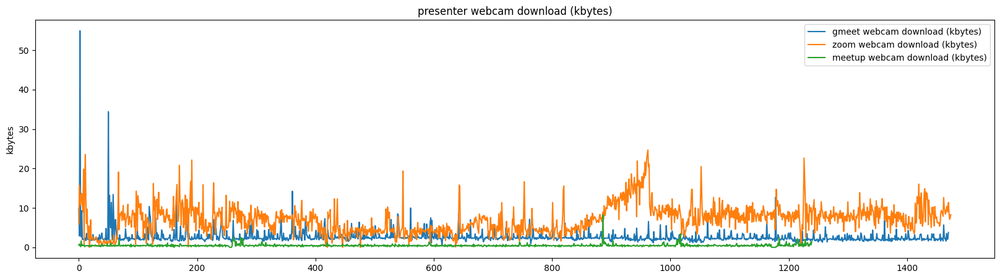

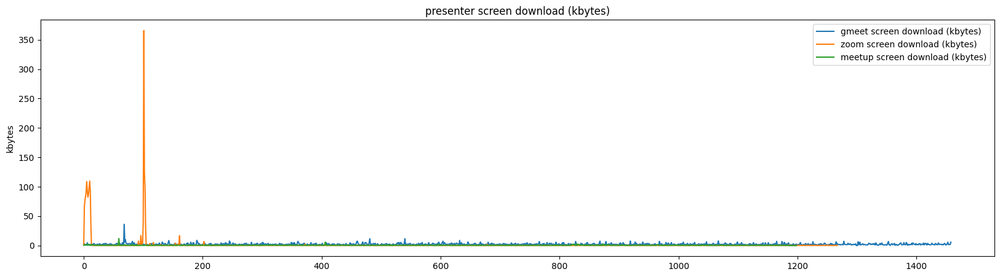

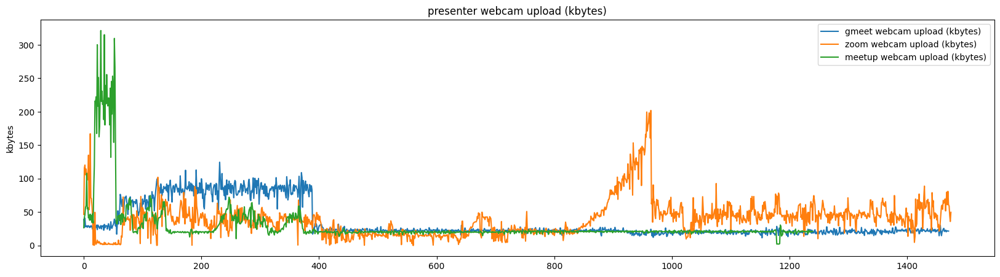

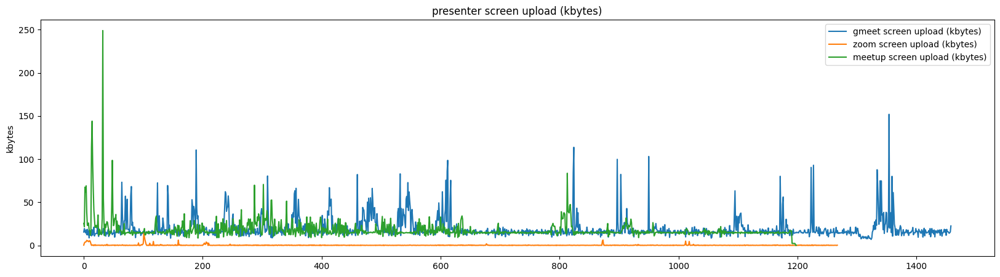

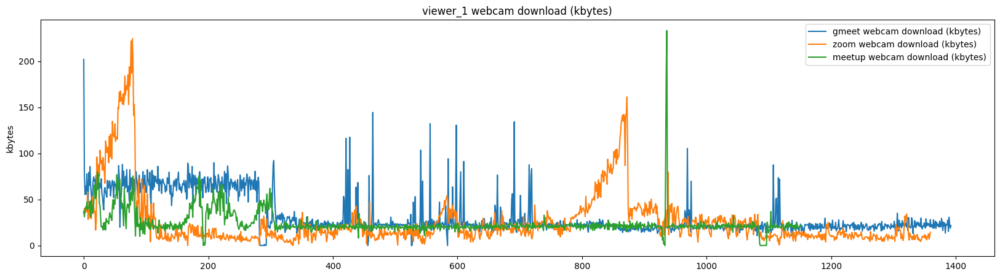

...

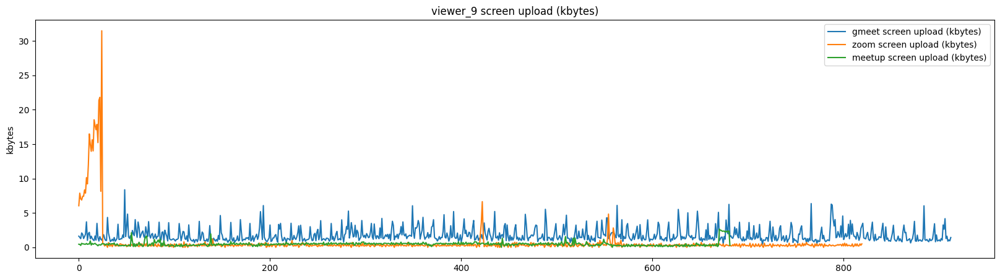

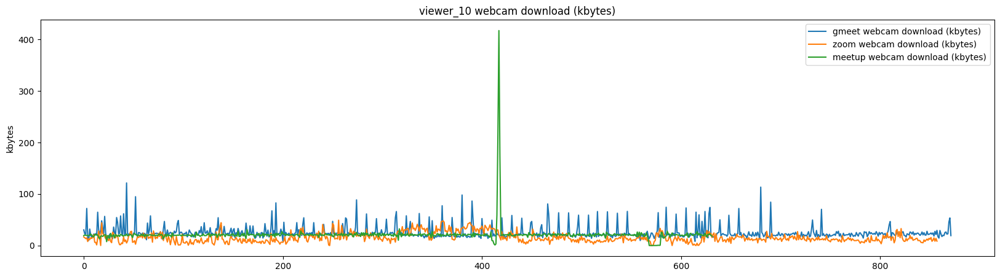

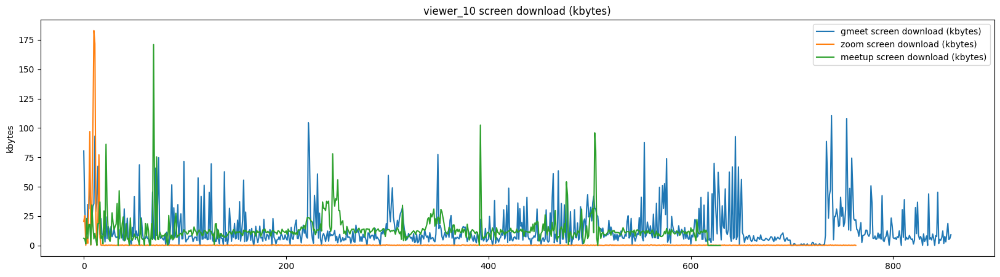

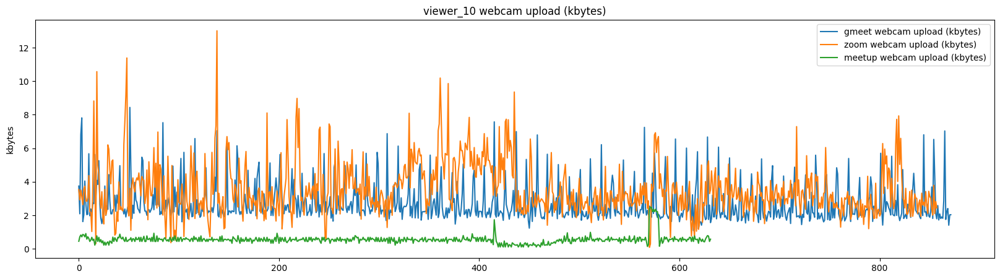

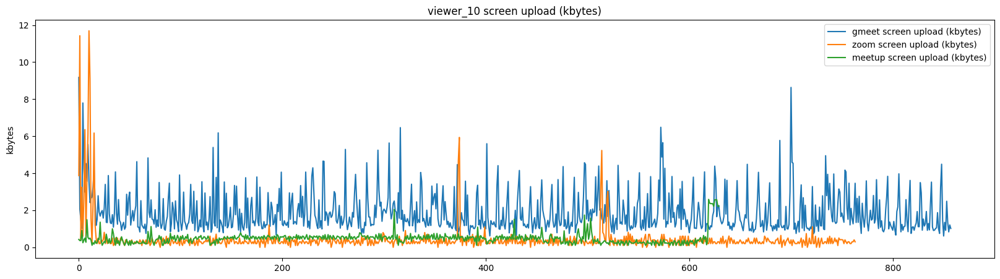

In [68]:
client_throughput_summary = pd.DataFrame()
for user in users:
    for bt in ['download_(bytes)', 'upload_(bytes)']:
        for ms in ['webcam', 'screen']:
            user_timestamps = bandwidth_timestamps[bandwidth_timestamps['name'] == user].iloc[0]
            gmeet_user = gmeet[gmeet['user'] == user]
            zoom_user = zoom[zoom['user'] == user]
            siruntu_user = siruntu[siruntu['user'] == user]

            # filter by media
            gmeet_user = gmeet_user[gmeet_user['media'] == ms]
            zoom_user = zoom_user[zoom_user['media'] == ms]
            siruntu_user = siruntu_user[siruntu_user['media'] == ms]

            gmeet_user = gmeet_user.reset_index(drop=True)
            zoom_user = zoom_user.reset_index(drop=True)
            siruntu_user = siruntu_user.reset_index(drop=True)

            gmeet_user['index'] = gmeet_user.index
            zoom_user['index'] = zoom_user.index
            siruntu_user['index'] = siruntu_user.index

            # convert bytes to kbytes
            gmeet_user[bt] = gmeet_user[bt] / 1024
            zoom_user[bt] = zoom_user[bt] / 1024
            siruntu_user[bt] = siruntu_user[bt] / 1024

            gmeet_min = gmeet_user[bt].min()
            zoom_min = zoom_user[bt].min()
            siruntu_min = siruntu_user[bt].min()

            gmeet_max = gmeet_user[bt].max()
            zoom_max = zoom_user[bt].max()
            siruntu_max = siruntu_user[bt].max()

            gmeet_mean = gmeet_user[bt].mean()
            zoom_mean = zoom_user[bt].mean()
            siruntu_mean = siruntu_user[bt].mean()

            types = bt.replace("_", " ")
            types = types.replace("(bytes)", "(kbytes)")
            plt.title(f'{user} {ms} {types}')
            plt.plot(gmeet_user['index'], gmeet_user[bt], label=f'gmeet {ms} {types}')
            plt.plot(zoom_user['index'], zoom_user[bt], label=f'zoom {ms} {types}')
            plt.plot(siruntu_user['index'], siruntu_user[bt], label=f'meetup {ms} {types}')
            plt.ylabel('kbytes')
            plt.legend()
            plt.gcf().set_size_inches(20, 5)
            plt.show()

            client_throughput_summary = pd.concat([client_throughput_summary, pd.DataFrame({
                'user': user,
                'media': ms,
                'type': types,
                'gmeet_min': "%.2f" % gmeet_min,
                'zoom_min': "%.2f" % zoom_min,
                'meetup_min': "%.2f" % siruntu_min,
                'gmeet_max': "%.2f" % gmeet_max,
                'zoom_max': "%.2f" % zoom_max,
                'meetup_max': "%.2f" % siruntu_max,
                'gmeet_avg': "%.2f" % gmeet_mean,
                'zoom_avg': "%.2f" %zoom_mean,
                'meetup_avg': "%.2f" % siruntu_mean,
            }, index=[0])])

In [69]:
# client_throughput_summary.to_csv('client_throughput_summary_newest.csv', index=False)
# change column name
summary = client_throughput_summary
summary.columns = summary.columns.str.replace('_', ' ')
summary.columns = summary.columns.str.title()

summary.to_csv('./summary/case_2_client_throughput_summary.csv', index=False)

client_throughput_summary

,User,Media,Type,Gmeet Min,Zoom Min,Meetup Min,Gmeet Max,Zoom Max,Meetup Max,Gmeet Avg,Zoom Avg,Meetup Avg
0,presenter,webcam,download (kbytes),0.67,0.00,0.00,54.93,24.68,8.23,2.66,7.10,0.47
0,presenter,screen,download (kbytes),0.00,0.00,0.00,36.09,365.61,11.85,2.18,1.60,0.48
0,presenter,webcam,upload (kbytes),11.53,0.00,2.22,124.60,201.96,321.36,35.02,39.29,30.33
0,presenter,screen,upload (kbytes),7.13,0.00,0.21,152.03,14.54,248.97,19.79,0.42,18.13
0,viewer_1,webcam,download (kbytes),0.00,0.00,0.00,202.14,224.81,233.46,32.22,26.34,24.55
0,viewer_1,screen,download (kbytes),0.00,0.00,0.00,149.68,976.01,259.63,17.07,9.26,15.78
0,viewer_1,webcam,upload (kbytes),1.13,0.10,0.11,20.57,15.96,2.47,2.39,3.66,0.54
0,viewer_1,screen,upload (kbytes),0.31,0.00,0.00,10.61,66.53,2.64,1.74,0.82,0.45
0,viewer_2,webcam,download (kbytes),0.00,0.00,0.00,162.45,280.66,190.22,28.33,31.99,23.11
0,viewer_2,screen,download (kbytes),0.00,0.00,0.00,159.70,89.88,265.62,17.19,0.53,16.01


#### CPU and RAM in client side

In [70]:
import os

f = './csv_newest/ram_cpu/'
list_files = os.listdir(f)

# remove "CPU RAM - server_siruntu.csv" from list_folder
list_files.remove('CPU RAM Baru - server_siruntu.csv')

ram_cpu_df = pd.DataFrame()

for fil in list_files:
    df = pd.read_csv(f'{f}/{fil}')
    df['time'] = pd.to_datetime(df['time'], format='%d/%m/%Y %H:%M:%S')
    df['memory'] = df['memory'].astype(int)
    df['memory'] = df['memory'] / 1024 # convert to MB
    df['cpu'] = df['cpu'].astype(float)
    ram_cpu_df = pd.concat([ram_cpu_df, df])

ram_cpu_df

,time,memory,cpu,app,media,user
0,2023-06-15 14:52:10,33.933594,18.8,siruntu,webcam,viewer_2
1,2023-06-15 14:53:00,33.402344,4.7,siruntu,webcam,viewer_2
2,2023-06-15 14:54:00,32.980469,4.7,siruntu,webcam,viewer_2
3,2023-06-15 14:55:00,37.132812,14.0,siruntu,webcam,viewer_2
4,2023-06-15 14:56:00,34.957031,9.4,siruntu,webcam,viewer_2
...,...,...,...,...,...,...
39,2023-06-15 15:42:00,144.269531,62.2,siruntu,screen,presenter
40,2023-06-15 15:43:01,146.046875,66.8,siruntu,screen,presenter
41,2023-06-15 15:44:01,144.375000,100.3,siruntu,screen,presenter
42,2023-06-15 15:45:01,145.410156,64.2,siruntu,screen,presenter


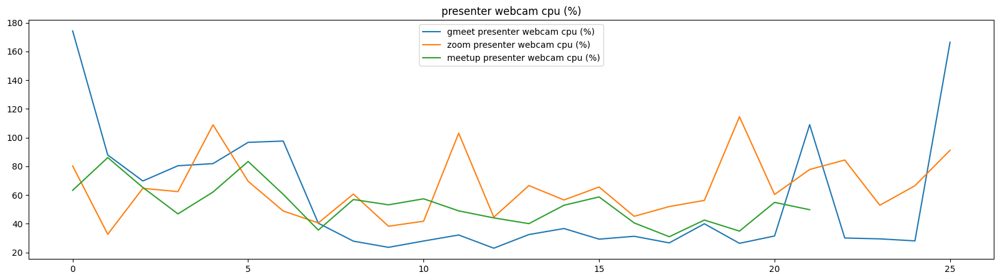

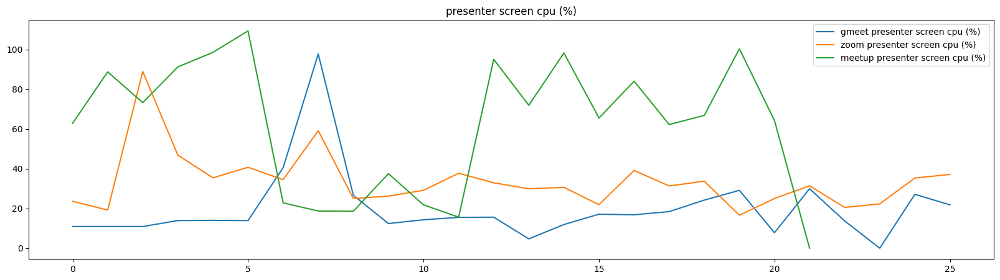

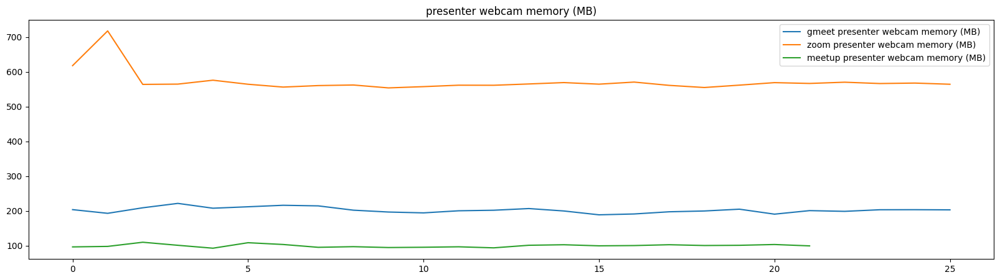

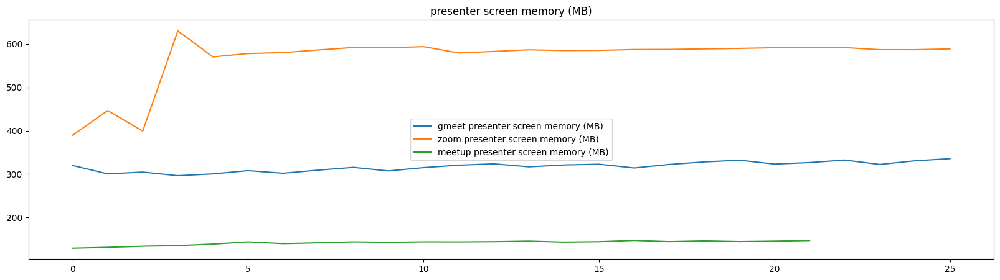

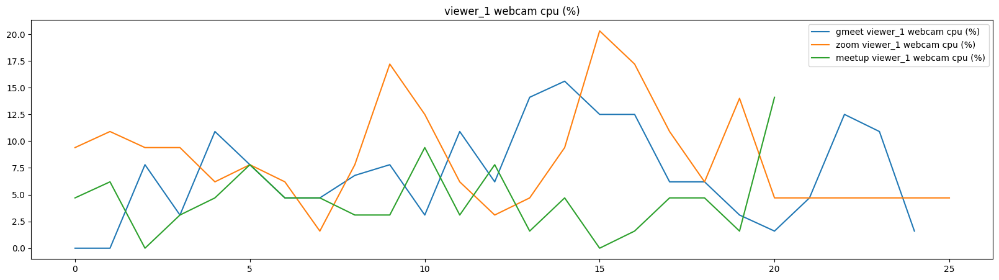

...

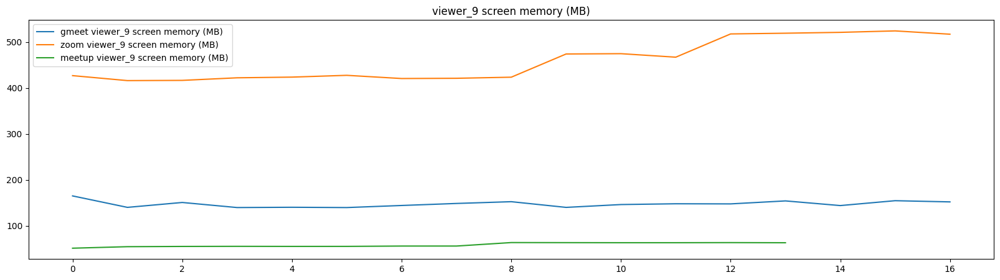

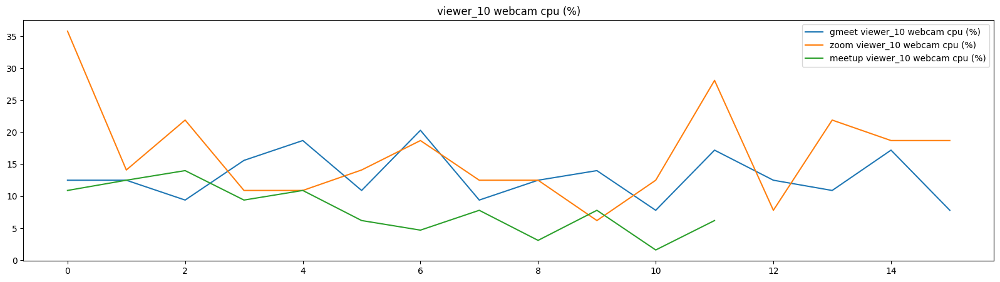

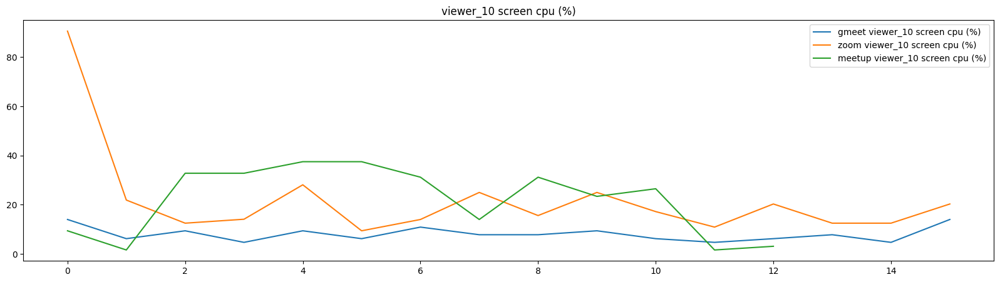

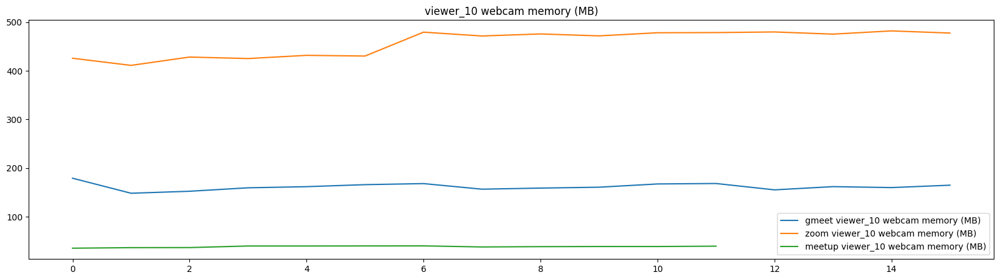

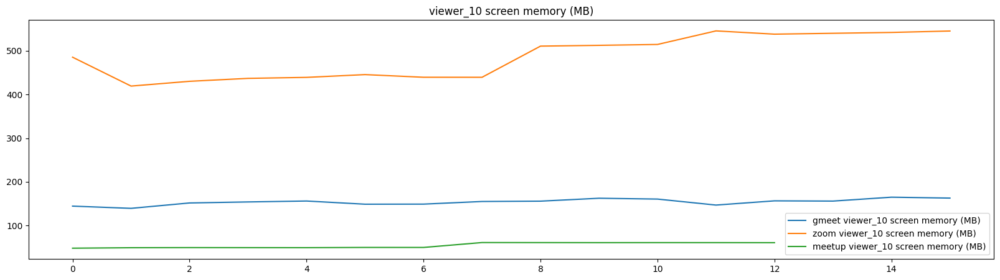

In [71]:
client_cpu_ram_summary = pd.DataFrame()
for user in users:
    for rs in ['cpu', 'memory']:
        for ms in ['webcam', 'screen']:
            ram_cpu_user = ram_cpu_df[ram_cpu_df['user'] == user]

            gmeet_resource = ram_cpu_user[(ram_cpu_user['app'] == 'gmeet') & (ram_cpu_user['media'] == ms)].reset_index(drop=True)
            zoom_resource = ram_cpu_user[(ram_cpu_user['app'] == 'zoom') & (ram_cpu_user['media'] == ms)].reset_index(drop=True)
            siruntu_resource = ram_cpu_user[(ram_cpu_user['app'] == 'siruntu') & (ram_cpu_user['media'] == ms)].reset_index(drop=True)

            gmeet_resource['index'] = gmeet_resource.index
            zoom_resource['index'] = zoom_resource.index
            siruntu_resource['index'] = siruntu_resource.index

            unit = '(MB)' if rs == 'memory' else '(%)'
            plt.title(f'{user} {ms} {rs} {unit}')
            plt.plot(gmeet_resource['index'], gmeet_resource[rs], label=f'gmeet {user} {ms} {rs} {unit}')
            plt.plot(zoom_resource['index'], zoom_resource[rs], label=f'zoom {user} {ms} {rs} {unit}')
            plt.plot(siruntu_resource['index'], siruntu_resource[rs], label=f'meetup {user} {ms} {rs} {unit}')

            plt.legend()
            plt.gcf().set_size_inches(20, 5)
            plt.show()

            # minimum value
            gmeet_min = gmeet_resource[rs].round(2).min()
            zoom_min = zoom_resource[rs].round(2).min()
            siruntu_min = siruntu_resource[rs].round(2).min()

            gmeet_max = gmeet_resource[rs].round(2).max()
            zoom_max = zoom_resource[rs].round(2).max()
            siruntu_max = siruntu_resource[rs].round(2).max()

            gmeet_avg = "%.2f" % gmeet_resource[rs].round(2).mean()
            zoom_avg = "%.2f" % zoom_resource[rs].round(2).mean()
            siruntu_avg = "%.2f" % siruntu_resource[rs].round(2).mean()

            rs_name = (f'{rs} (%)') if rs == 'cpu' else (f'{rs} (MB)')
            client_cpu_ram_summary = pd.concat([client_cpu_ram_summary, pd.DataFrame({
                'user': user,
                'media_stream': ms,
                'resource': rs_name,
                'gmeet_min': gmeet_min,
                'zoom_min': zoom_min,
                'meetup_min': siruntu_min,
                'gmeet_max': gmeet_max,
                'zoom_max': zoom_max,
                'meetup_max': siruntu_max,
                'gmeet_avg': gmeet_avg,
                'zoom_avg': zoom_avg,
                'meetup_avg': siruntu_avg
            }, index=[0])], ignore_index=True)

In [72]:
# client_cpu_ram_summary.to_csv('client_cpu_bandwidth_summary.csv', index=False)
summary = client_cpu_ram_summary
summary.columns = summary.columns.str.replace('_', ' ')
summary.columns = summary.columns.str.title()
summary.to_csv('./summary/case_2_client_cpu_ram_summary.csv', index=False)

client_cpu_ram_summary

,User,Media Stream,Resource,Gmeet Min,Zoom Min,Meetup Min,Gmeet Max,Zoom Max,Meetup Max,Gmeet Avg,Zoom Avg,Meetup Avg
0,presenter,webcam,cpu (%),23.00,32.70,31.00,174.30,114.50,86.10,56.97,64.87,53.15
1,presenter,screen,cpu (%),0.00,16.60,0.00,97.70,88.90,109.30,19.98,33.61,62.13
2,presenter,webcam,memory (MB),188.39,553.45,92.37,221.26,717.37,109.50,202.02,571.50,99.35
3,presenter,screen,memory (MB),296.32,389.52,129.06,335.52,630.27,147.11,317.30,568.06,141.69
4,viewer_1,webcam,cpu (%),0.00,1.60,0.00,15.60,20.30,14.10,7.01,8.41,4.54
5,viewer_1,screen,cpu (%),0.00,0.00,0.00,17.20,12.50,9.40,6.74,5.45,3.76
6,viewer_1,webcam,memory (MB),111.63,431.10,32.23,142.33,537.51,47.97,127.44,453.37,41.28
7,viewer_1,screen,memory (MB),157.39,446.43,56.78,1779.73,560.58,63.37,234.37,483.63,60.31
8,viewer_2,webcam,cpu (%),23.40,9.40,1.60,45.30,37.40,18.80,33.35,22.44,8.11
9,viewer_2,screen,cpu (%),20.30,14.00,3.10,49.90,31.20,40.60,32.65,22.28,19.68


### Server  usage resources

#### Load files

In [73]:
files = './csv_newest/ram_cpu/CPU RAM Baru - server_siruntu.csv'

df = pd.read_csv(files)
# add empty column
df['time'] = pd.to_datetime(df['time'], format='%d/%m/%Y %H:%M:%S')
df['memory'] = df['memory'].astype(int)
df['cpu'] = df['cpu'].astype(float)

# i want fill df['download (bytes)'] conditionally with df['donwload'] and df['download (unit)']
# if df['download (unit)'] == 'k' then df['download (kbytes)'] = df['download']
# elif df['download (unit)'] == 'k' then df['download (kbytes)'] = df['download'] * 1024

for i in range(0, len(df)):
    if df.loc[i, 'download (unit)'] == 'k':
        df.loc[i, 'download (bytes)'] = df.loc[i, 'download'] * 1024
    else:
        df.loc[i, 'download (bytes)'] = df.loc[i, 'download']

    if df.loc[i, 'upload (unit)'] == 'm':
        df.loc[i, 'upload (bytes)'] = df.loc[i, 'upload'] * 1024
    else:
        df.loc[i, 'upload (bytes)'] = df.loc[i, 'upload']

df['download (bytes)'] = (df['download (bytes)'] / 1024).round(2)
df['upload (bytes)'] = (df['upload (bytes)'] / 1024).round(2)
# rename columns
df = df.rename(columns={'download (bytes)': 'download (kbytes)',
               'upload (bytes)': 'upload (kbytes)'})
df

,time,memory,cpu,download (kbytes),upload (kbytes),app,media,user,download,upload,download (unit),upload (unit),client
0,2023-06-15 14:50:12,4186,0.00,304.32,0.33,siruntu,webcam,server,304.32,339.74,k,k,presenter
1,2023-06-15 14:51:02,4317,1.83,0.00,0.01,siruntu,webcam,server,1.91,13.22,m,k,viewer 1
2,2023-06-15 14:52:02,4534,4.91,767.94,0.84,siruntu,webcam,server,767.94,863.71,k,k,viewer_2
3,2023-06-15 14:53:02,4573,2.51,165.92,0.32,siruntu,webcam,server,165.92,329.86,k,k,viewer_3
4,2023-06-15 14:54:03,4728,3.51,212.35,0.58,siruntu,webcam,server,212.35,598.58,k,k,viewer_4
5,2023-06-15 14:55:03,5008,3.06,160.96,0.55,siruntu,webcam,server,160.96,566.30,k,k,viewer_5
6,2023-06-15 14:56:03,5494,6.54,361.25,2.35,siruntu,webcam,server,361.25,2.35,k,m,viewer_6
7,2023-06-15 14:57:03,5588,6.93,196.76,1.01,siruntu,webcam,server,196.76,1.01,k,m,viewer_7
8,2023-06-15 14:58:03,5864,6.70,203.20,1.20,siruntu,webcam,server,203.20,1.20,k,m,viewer_8
9,2023-06-15 14:59:03,6106,6.17,192.78,1.26,siruntu,webcam,server,192.78,1.26,k,m,viewer_9


#### RAM

/tmp/ipykernel_14271/2647569536.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


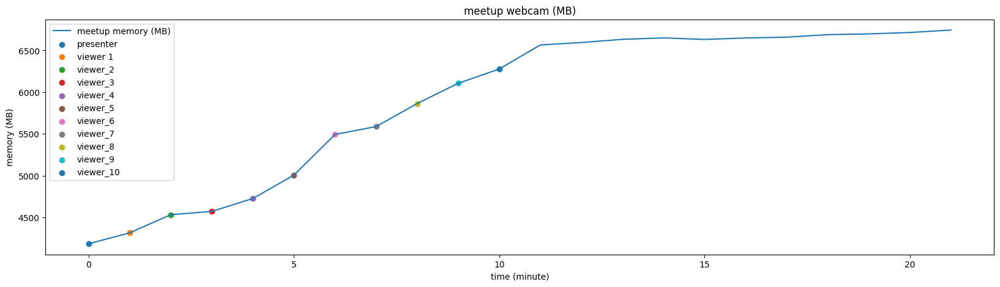

********************* maximum value *********************
meetup webcam memory (MB): 6743
********************* minimum value *********************
meetup webcam memory (MB): 4186
********************* average value *********************
meetup webcam memory (MB): 5904.27


/tmp/ipykernel_14271/2647569536.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


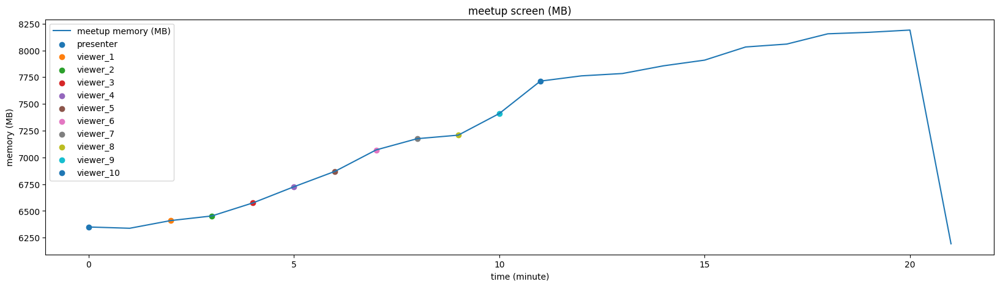

********************* maximum value *********************
meetup screen memory (MB): 8190
********************* minimum value *********************
meetup screen memory (MB): 6193
********************* average value *********************
meetup screen memory (MB): 7291.23


In [74]:
for ms in ['webcam', 'screen']:
    unit = '(MB)'
    df_media = df[df['media'] == ms]
    df_media.reset_index(drop=True, inplace=True)
    df_media['index'] = df_media.index

    plt.title(f'meetup {ms} {unit}')
    plt.xlabel("time (minute)")
    plt.ylabel("memory (MB)")

    plt.plot(df_media['index'], df_media['memory'],
             label=f'meetup memory {unit}')

    clients = df_media['client']
    for idx, x in enumerate(clients):
        if x != 'x':
            plt.scatter(df_media['index'][idx], df_media['memory'][idx],
                        label=f'{x}')

    plt.legend()
    plt.gcf().set_size_inches(20, 5)
    plt.show()

    print('********************* maximum value *********************')
    print(f'meetup {ms} memory {unit}: {df_media["memory"].max()}')
    print('********************* minimum value *********************')
    print(f'meetup {ms} memory {unit}: {df_media["memory"].min()}')
    print('********************* average value *********************')
    print(f'meetup {ms} memory {unit}: {df_media["memory"].mean() :.2f}')

#### CPU

/tmp/ipykernel_14271/1836585332.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


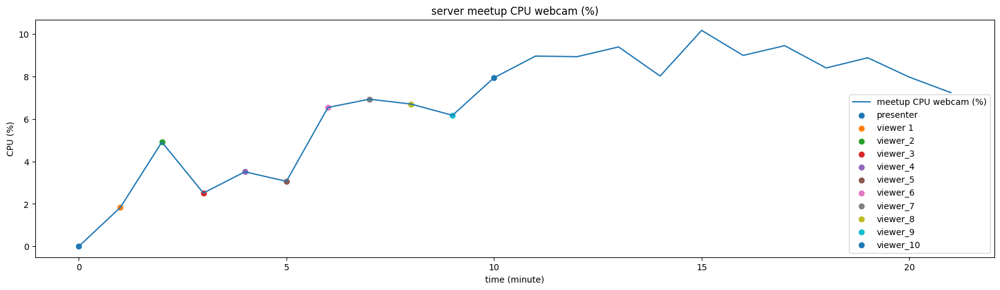

********************* maximum value *********************
meetup webcam CPU (%): 10.17
********************* minimum value *********************
meetup webcam CPU (%): 0.0
********************* average value *********************
meetup webcam CPU (%): 6.659090909090909


/tmp/ipykernel_14271/1836585332.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


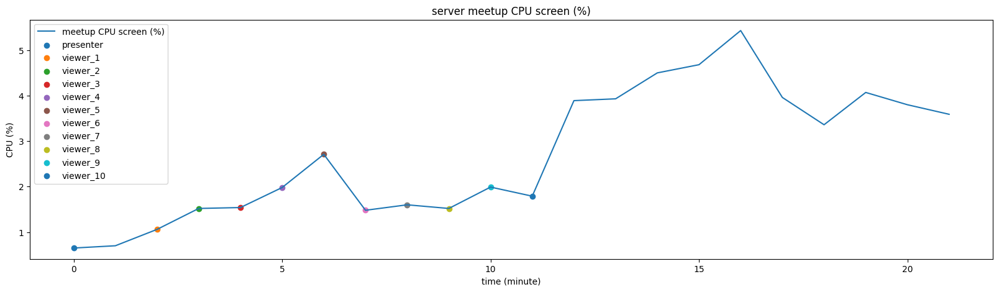

********************* maximum value *********************
meetup screen CPU (%): 5.43
********************* minimum value *********************
meetup screen CPU (%): 0.65
********************* average value *********************
meetup screen CPU (%): 2.715909090909091


In [75]:
for ms in ['webcam', 'screen']:
    df_media = df[df['media'] == ms]
    df_media.reset_index(drop=True, inplace=True)
    df_media['index'] = df_media.index

    plt.title(f'server meetup CPU {ms} (%)')
    plt.xlabel("time (minute)")
    plt.ylabel("CPU (%)")

    plt.plot(df_media['index'], df_media['cpu'], label=f'meetup CPU {ms} (%)')

    clients = df_media['client']
    for idx, x in enumerate(clients):
        if x != 'x':
            plt.scatter(df_media['index'][idx], df_media['cpu'][idx],
                        label=f'{x}')

    plt.legend()
    plt.gcf().set_size_inches(20, 5)
    plt.show()

    print('********************* maximum value *********************')
    print(f'meetup {ms} CPU (%): {df_media["cpu"].max()}')
    print('********************* minimum value *********************')
    print(f'meetup {ms} CPU (%): {df_media["cpu"].min()}')
    print('********************* average value *********************')
    print(f'meetup {ms} CPU (%): {df_media["cpu"].mean()}')

#### Throughput (download and upload) in Server

/tmp/ipykernel_14271/4293762976.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


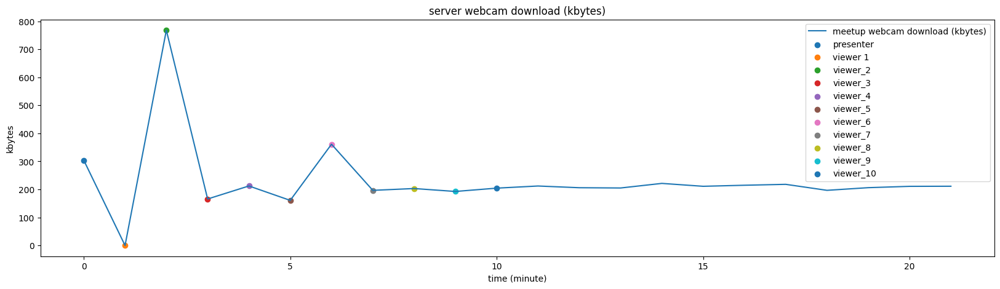

********************* maximum value *********************
meetup webcam download (kbytes): 767.94
********************* minimum value *********************
meetup webcam download (kbytes): 0.0
********************* average value *********************
meetup webcam download (kbytes): 231.13227272727275


/tmp/ipykernel_14271/4293762976.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


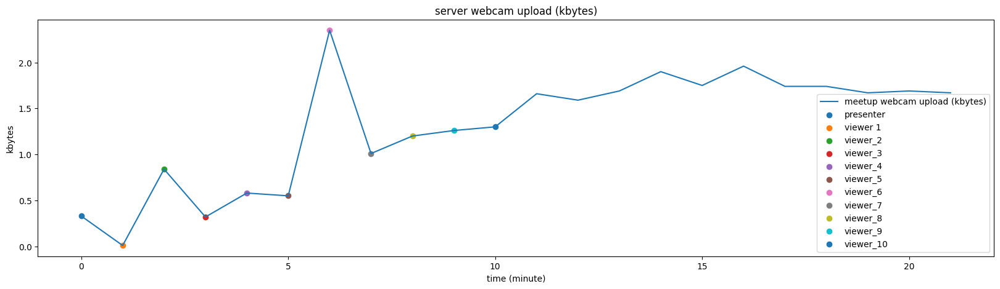

********************* maximum value *********************
meetup webcam upload (kbytes): 2.35
********************* minimum value *********************
meetup webcam upload (kbytes): 0.01
********************* average value *********************
meetup webcam upload (kbytes): 1.3095454545454543


/tmp/ipykernel_14271/4293762976.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


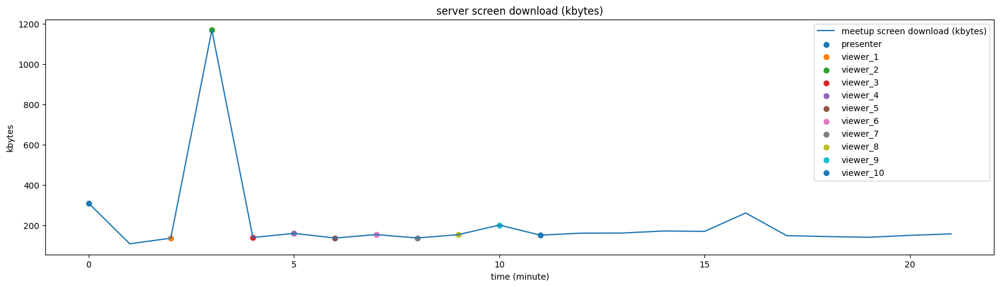

********************* maximum value *********************
meetup screen download (kbytes): 1169.08
********************* minimum value *********************
meetup screen download (kbytes): 108.83
********************* average value *********************
meetup screen download (kbytes): 210.60909090909092


/tmp/ipykernel_14271/4293762976.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media['index'] = df_media.index


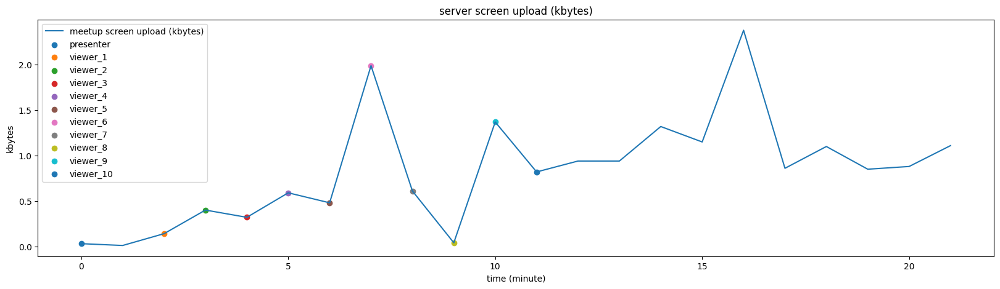

********************* maximum value *********************
meetup screen upload (kbytes): 2.38
********************* minimum value *********************
meetup screen upload (kbytes): 0.01
********************* average value *********************
meetup screen upload (kbytes): 0.8331818181818181


In [76]:
for ms in ['webcam', 'screen']:
    for bt in ['download (kbytes)', 'upload (kbytes)']:
        df_media = df[(df['media'] == ms)]
        df_media.reset_index(drop=True, inplace=True)
        df_media['index'] = df_media.index

        plt.title(f'server {ms} {bt}')
        plt.xlabel("time (minute)")
        plt.ylabel("kbytes")

        plt.plot(df_media['index'], df_media[bt], label=f'meetup {ms} {bt}')

        clients = df_media['client']
        for idx, x in enumerate(clients):
            if x != 'x':
                plt.scatter(df_media['index'][idx], df_media[bt][idx],
                            label=f'{x}')

        plt.legend()
        plt.gcf().set_size_inches(20, 5)
        plt.show()

        print('********************* maximum value *********************')
        print(f'meetup {ms} {bt}: {df_media[bt].max()}')
        print('********************* minimum value *********************')
        print(f'meetup {ms} {bt}: {df_media[bt].min()}')
        print('********************* average value *********************')
        print(f'meetup {ms} {bt}: {df_media[bt].mean()}')
